## Mini Project 3: Recommendation Engine using Collaborative Filtering

A __recommender system__ is a subclass of information filtering system that seeks to predict the “rating” or “preference” a user would give to an item. 

Recommender systems are utilized in a variety of areas including:
1. movies
2. music
3. news
4. books
5. research articles
6. search queries
7. social tags
8. product

There are 3 types of Recommendation Engines:
1. Collaborative filtering<br/>
&nbsp; &nbsp;User-based filtering<br/>
&nbsp; &nbsp;Item-based filtering
2. Content-based filtering
3. Hybrid recommender system

This Mini Project is to use CF to do music recommendations.
https://nijianmo.github.io/amazon/index.html

http://deepyeti.ucsd.edu/jianmo/amazon/categoryFilesSmall/Digital_Music.csv



## Data Exploration

In [236]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython import display 


In [237]:
#data = pd.read_csv('data/archive/rating.csv', delimiter='\t')  # this one very big
data = pd.read_csv('Digital_Music.csv')

In [238]:
data.shape

(1584082, 4)

In [239]:
data.head(5)

,userId,musicId,rating,time
0,0001388703,A1ZCPG3D3HGRSS,5.0,1387670400
1,0001388703,AC2PL52NKPL29,5.0,1378857600
2,0001388703,A1SUZXBDZSDQ3A,5.0,1362182400
3,0001388703,A3A0W7FZXM0IZW,5.0,1354406400
4,0001388703,A12R54MKO17TW0,5.0,1325894400


In [240]:
data.tail(5)

,userId,musicId,rating,time
1584077,B01HJ91P94,AR3KABMPL5L0O,5.0,1520035200
1584078,B01HJ91P94,A2N53GHW73INDH,4.0,1516752000
1584079,B01HJ91P94,ABNKLDCCVJKW1,5.0,1492732800
1584080,B01HJ91IVY,AMWSDABZWFRAT,5.0,1519344000
1584081,B01HJ91IVY,A7K5263R5OUIP,5.0,1494979200


In [241]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1584082 entries, 0 to 1584081
Data columns (total 4 columns):
 #   Column   Non-Null Count    Dtype  
---  ------   --------------    -----  
 0   userId   1584082 non-null  object 
 1   musicId  1584082 non-null  object 
 2   rating   1584082 non-null  float64
 3   time     1584082 non-null  int64  
dtypes: float64(1), int64(1), object(2)
memory usage: 48.3+ MB


In [242]:
data.rating.value_counts()


5.0    1280147
4.0     179929
3.0      57347
1.0      43108
2.0      23551
Name: rating, dtype: int64

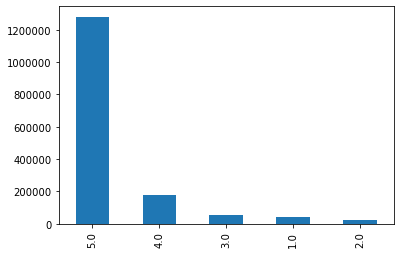

In [243]:
data.rating.value_counts().plot(kind='bar')
plt.show()

In [244]:
data.isnull().sum()


userId     0
musicId    0
rating     0
time       0
dtype: int64

## Data Processing

In [245]:
#!conda install -c conda-forge scikit-surprise

In [246]:
#data = data[['user_id', 'movie_id', 'rating', 'timestamp']]
data = data[['userId', 'musicId', 'rating', 'time']]
data = data.iloc[:, :-1]

In [247]:
from surprise import Reader, Dataset
reader = Reader(rating_scale = (1.0, 5.0))
df = Dataset.load_from_df(data[['userId', 'musicId', 'rating']], reader)

## Model Training

In [248]:
from surprise.model_selection import train_test_split

trainset, testset = train_test_split(df, test_size=0.25)

In [249]:
from surprise import SVD, accuracy
from surprise.model_selection import cross_validate
algo = SVD(n_epochs = 20, n_factors = 50, verbose = True)
algo.fit(trainset)

cross_validate(algo, df, measures=['RMSE', 'MAE'], cv=5, verbose=True);

Processing epoch 0
Processing epoch 1
Processing epoch 2
Processing epoch 3
Processing epoch 4
Processing epoch 5
Processing epoch 6
Processing epoch 7
Processing epoch 8
Processing epoch 9
Processing epoch 10
Processing epoch 11
Processing epoch 12
Processing epoch 13
Processing epoch 14
Processing epoch 15
Processing epoch 16
Processing epoch 17
Processing epoch 18
Processing epoch 19
Processing epoch 0
Processing epoch 1
Processing epoch 2
Processing epoch 3
Processing epoch 4
Processing epoch 5
Processing epoch 6
Processing epoch 7
Processing epoch 8
Processing epoch 9
Processing epoch 10
Processing epoch 11
Processing epoch 12
Processing epoch 13
Processing epoch 14
Processing epoch 15
Processing epoch 16
Processing epoch 17
Processing epoch 18
Processing epoch 19
Processing epoch 0
Processing epoch 1
Processing epoch 2
Processing epoch 3
Processing epoch 4
Processing epoch 5
Processing epoch 6
Processing epoch 7
Processing epoch 8
Processing epoch 9
Processing epoch 10
Processing

In [250]:
predictions = algo.test(testset)

In [251]:
predictions[:5]

[Prediction(uid='B003RLEENS', iid='A345RH02OOFUQQ', r_ui=5.0, est=4.837563698929322, details={'was_impossible': False}),
 Prediction(uid='B001DBJR36', iid='AN98J9NK6JOAI', r_ui=5.0, est=4.767686114693605, details={'was_impossible': False}),
 Prediction(uid='3817734107', iid='A29SJB20HXTT4O', r_ui=5.0, est=4.542892492812269, details={'was_impossible': False}),
 Prediction(uid='B00U2OSYRU', iid='A1IT8YRA60N1U8', r_ui=5.0, est=4.7061020437204, details={'was_impossible': False}),
 Prediction(uid='B0022P835K', iid='A1JA1WW4JGXID4', r_ui=5.0, est=4.81757561655971, details={'was_impossible': False})]

## Model Evaluation

In [252]:
from surprise import accuracy
accuracy.rmse(predictions)

RMSE: 0.6344


0.6344285457465774

## Model Deployment

In [253]:
user_id = 'B0034EADHE'
music_id = 'A1ZCPG3D3HGRSS'
predicted_rating = algo.predict(str(user_id), str(music_id))
predicted_rating

Prediction(uid='B0034EADHE', iid='A1ZCPG3D3HGRSS', r_ui=None, est=4.64910592684689, details={'was_impossible': False})

In [254]:
music_id = 'A3IV5GXI5XSHF8'
predicted_rating = algo.predict(str(user_id), str(music_id))
predicted_rating

Prediction(uid='B0034EADHE', iid='A3IV5GXI5XSHF8', r_ui=None, est=4.6993589126503865, details={'was_impossible': False})

In [255]:
testset[5]

('B0013F0LD2', 'A1U38VF9WZEHL9', 5.0)

In [256]:
recommendations = [pred for pred in predictions if pred[1] == "A2DBKEKP5BSWC6"]

In [257]:
recommendations

[Prediction(uid='B0034EADHE', iid='A2DBKEKP5BSWC6', r_ui=5.0, est=4.73201431443613, details={'was_impossible': False})]

### How to intepret the result?
- UID: user-id
- iid: item id
- Rui: the rating given by the user
- est: rating estimated by the model
- Iu: No of items rated by the user
- UI: number of users that have rated this item
- err: abs difference between predicted rating and the actual rating.

In [258]:
## How to check if our results make sense? Check if the genre is the same as input.
# movies_info = pd.read_csv('movies_metadata.csv', usecols = ['title','id','genres'], low_memory = True)

In [272]:
from collections import defaultdict

def get_all_predictions(predictions):
    
    # First map the predictions to each user.
    top_n = defaultdict(list)    
    for uid, iid, true_r, est, _ in predictions:
        top_n[uid].append((iid, est))
    # Then sort the predictions for each user
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
    return top_n

all_pred = get_all_predictions(predictions)



In [273]:
new_all_pred=dict(filter(lambda elem: len(elem[1]) != 1, all_pred.items()))

In [274]:
new_all_pred

{'3817734107': [('A8B81XKP5WSFN', 4.550944058846459),
  ('A29SJB20HXTT4O', 4.542892492812269)],
 'B0022P835K': [('A2EXGK5SNGG0QF', 4.913460758485723),
  ('A1JA1WW4JGXID4', 4.81757561655971)],
 'B0013F0LD2': [('A2N3GV82UDP5M5', 5.0),
  ('A13OMT8D4GPIBV', 5.0),
  ('A3HY0K2HF0J2MC', 4.965198293640374),
  ('A2FWZ58M6IQMD7', 4.951094337851439),
  ('A1DFXGERAWAXK2', 4.950851566869027),
  ('A1DFXGERAWAXK2', 4.950851566869027),
  ('ATWFEB45HM6O7', 4.890938416343633),
  ('A1X6O2OAPMT044', 4.882600232374307),
  ('A2Y33PEOXOORTE', 4.882102661931135),
  ('A19S9RSYL37HBJ', 4.866758546607709),
  ('A3I6LM0QVIZJ0R', 4.862391898229098),
  ('A1PZP0XRQS1S9F', 4.857584243725864),
  ('AK8UH1MS2KBHH', 4.85693837920552),
  ('A2P2UFPXF1L3P3', 4.856197327501566),
  ('A2P2UFPXF1L3P3', 4.856197327501566),
  ('A3XBWOVL9WIES', 4.853020938215518),
  ('A3XBWOVL9WIES', 4.853020938215518),
  ('A1BV1LCNQASX47', 4.850700240773242),
  ('A3J65KIL2S2ZLC', 4.850003626617634),
  ('A2M9A56OIDDYXA', 4.847553468406376),
  ('A2Q

In [271]:
n = 1
for uid, user_ratings in new_all_pred.items():
    user_ratings.sort(key=lambda x: x[1], reverse=True)
    new_all_pred[uid] = user_ratings[:n]
    
tmp = pd.DataFrame.from_dict(new_all_pred)
tmp_transpose = tmp.transpose()

In [267]:
tmp_transpose

,0
3817734107,"(A8B81XKP5WSFN, 4.550944058846459)"
B0022P835K,"(A2EXGK5SNGG0QF, 4.913460758485723)"
B0013F0LD2,"(A2N3GV82UDP5M5, 5.0)"
B000SXKWXY,"(A25RRQRDUN6MZF, 4.847279022225588)"
B010GLWJXI,"(A1JW1VKFDNNFWO, 5.0)"
B009CRGC18,"(A14KLLDGBC8D11, 4.900739785451295)"
B00124HVBO,"(AP8TXUCGIXQXI, 4.6122352382556695)"
B004ZJDRSO,"(A1A9DYX0S1CMZU, 4.866321154503302)"
B0013R80FQ,"(A3KT0V17ITKSTV, 4.830486592043564)"
B0013G0L72,"(A235V2MM0QCKE4, 4.954694992930099)"


In [279]:
# Make Top 4 recommendations based on user id.
# Question: What movies does user_id = 2134 like?

def get_predictions(user_id):
    results = tmp_transpose.loc[user_id]
    return results

#user_id="B000WYBAFI"
user_id="3817734107"

results = get_predictions(user_id)
results

0    (A8B81XKP5WSFN, 4.550944058846459)
Name: 3817734107, dtype: object

In [281]:

user_id="B0013F0LD2"
recommendations = get_predictions(user_id)
recommendations

0    (A2N3GV82UDP5M5, 5.0)
Name: B0013F0LD2, dtype: object